# **Graph Analysis**

### 0. Warm-up: **Zachary's Karate Club**

Perhaps the most famous benchmark graph is Zachary's Karate Club. It contains 34 nodes, representing members of a karate club whose interactions were monitored over a period of three years by researchers. Links in this graph connect individuals interacting outside club activities, a proxy for social ties.

During the course of the study, a conflict between the instructor Mr. Hi (node 0) and the president, or Officer (node 33) led to a split of the club into separate groups led by Mr. Hi and Officer. In this case we know whom each member of the group followed after the split, providing empirical community labels: those members who followed Mr. Hi are said to be one community and those following the Officer make up the other.

For this graph, we assume that the post-split group composition was largely driven by the social ties: members of the same friend groups would want to be part of the same club after the split. We thus expect a good community-detection algorithm to predict the post-split group composition with high accuracy.

Zachary's karate club is such a popular benchmark graph that it has its own function in NetworkX:

 Draw the karate club with `networkx`.

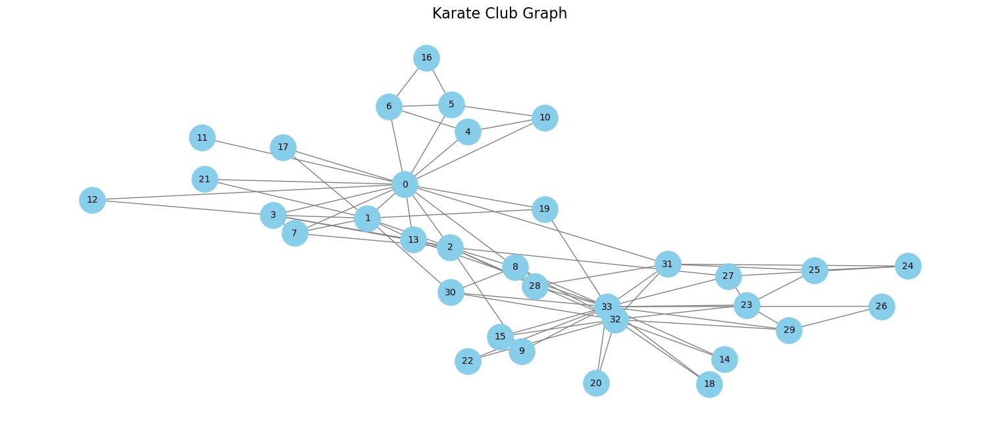

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the Karate Club graph using networkx
G = nx.karate_club_graph()

# Draw the graph
plt.figure(figsize=(15, 6))
pos = nx.spring_layout(G, seed=42)  # Spring layout for aesthetics
nx.draw(
    G, pos, with_labels=True, node_color='skyblue', edge_color='gray',
    node_size=800, font_size=10, font_color='black'
)
plt.title("Karate Club Graph", fontsize=16)
plt.show()

### 1. Agglomerative Method: Hierarchical Clustering
In this method, we start with a **distance matrix** $D$, which is a matrix that provides the distance between two nodes $i$ and $j$ in network $G$. Using $D$, we then perform [hierarchical clustering](http://docs.scipy.org/doc/scipy-0.17.0/reference/cluster.hierarchy.html#module-scipy.cluster.hierarchy) in a recursive manner, group _similar_ nodes at each step. There are various ways to perform the similarity grouping using _agglomerative procedures_ such as **single**, **complete**, and **average**, to name a few. In this section, we implement the [average/UPGMA linkage](http://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.cluster.hierarchy.average.html#scipy.cluster.hierarchy.average).

Perform **Hierarchical clustering** and visualize the **order** in which the nodes are grouped together in communities.




#### Hierarchichal Clustering ()

In [ ]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
import networkx as nx
import matplotlib.pyplot as plt

G = nx.karate_club_graph()

adj_matrix = nx.to_numpy_array(G)

# Distance matrix (using shortest path lengths as the distance metric)
distance_matrix = 1 / (1 + adj_matrix)  # Invert weights, adding 1 to avoid division by zero
np.fill_diagonal(distance_matrix, 0)   # Zero out diagonal (self-distances)

linked = linkage(pdist(distance_matrix), method='ward')

#### Visualization ()

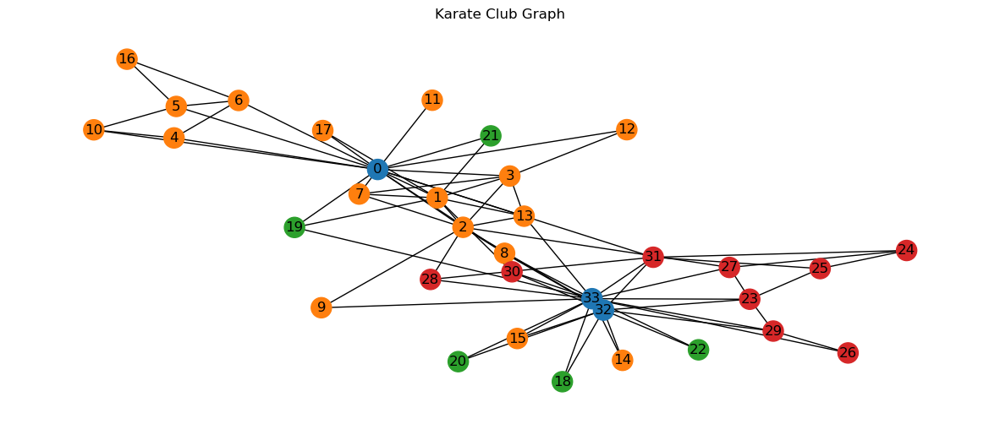

In [ ]:
colors = dendrogram(linked, orientation='top', labels=list(range(1, len(G)+1)), no_plot=True)['color_list']

# Visualize the graph with colored nodes
pos = nx.spring_layout(G)

fig, ax = plt.subplots(figsize=(15, 6))
nx.draw_networkx_nodes(G, pos, node_color=[colors[i-1] for i in G.nodes()], ax=ax)
nx.draw_networkx_edges(G, pos, ax=ax)
nx.draw_networkx_labels(G, pos, ax=ax)

ax.set_title('Karate Club Graph')
ax.set_axis_off()
plt.show()


#### Dendrogram
The dendrogram allows us to visualize the order in which nodes are grouped together in the clustering process.

Visualize the clustering process to show which nodes are grouped together.



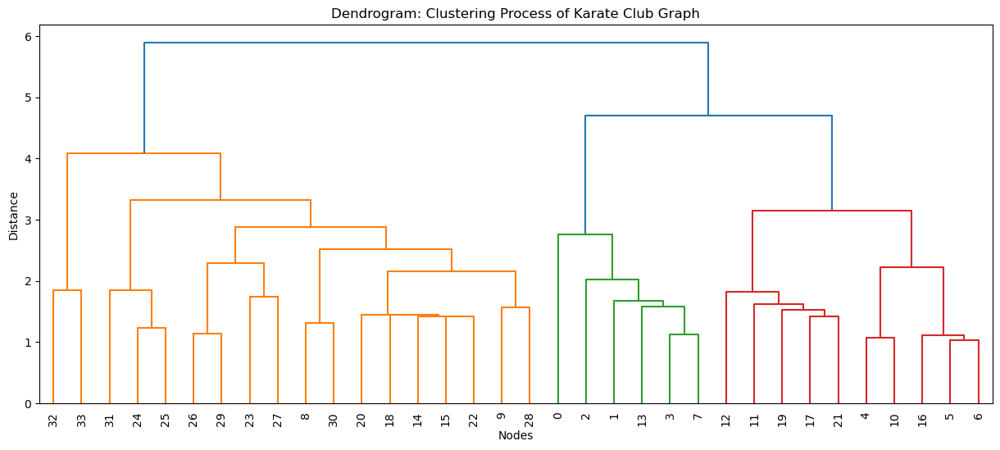

In [ ]:
plt.figure(figsize=(15, 6))
dendrogram(
    linked,
    labels=list(G.nodes),
    leaf_rotation=90,
    leaf_font_size=10,
    color_threshold=0.7 * max(linked[:, 2])
)
plt.title("Dendrogram: Clustering Process of Karate Club Graph")
plt.xlabel("Nodes")
plt.ylabel("Distance")
plt.show()


### 2. Modularity-Based Community Detection: The Louvain Method

The **community detection algorithm** that we implement in this notebook is a **modularity**-based algorithm. The **modularity** $M_c$ quantifies how good a "community" or partition is, and is given by

\begin{equation}
M_c = \sum _{c=1} ^{n_c} \left[ \frac{L_c}{L} - \left (\frac{k_c}{2L} \right)^2\right]
\end{equation}

where $n_c$ is the number of communities, $L_c$ is the number of links within the community, $k_c$ is the total degree of nodes belonging to the community, and $L$ is the total number of links in the network. The illustration below that is taken from the slide deck shows how modularity is calculated.
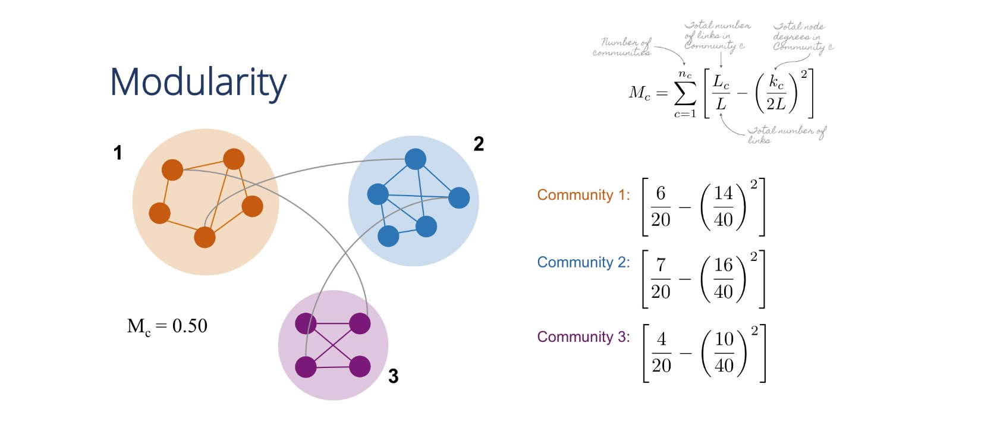

The higher the network modularity is, the more optimal the partitionioning. And, if you only have a single community, $M=0$.

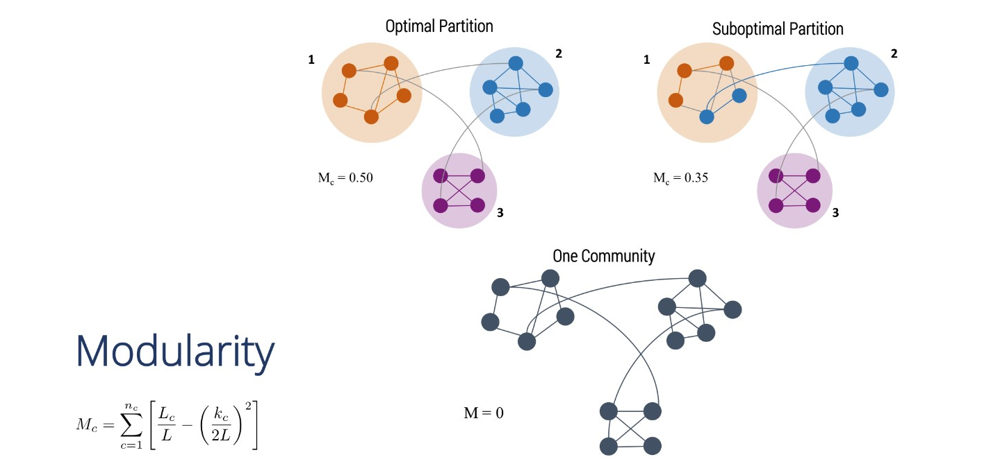

In this recipe, we implement a modularity-maximization algorithm called the Louvain algorithm. We go back to Zachary's karate club and find the best partitions.

#### Best Partitions

Find the best partitions in Karate club.



In [ ]:
!pip install python-louvain

     ---------------------------------------- 0.0/204.6 kB ? eta -:--:--
     ---------------------------------------- 0.0/204.6 kB ? eta -:--:--
     ---------------------------------------- 0.0/204.6 kB ? eta -:--:--
     ---------------------------------------- 0.0/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ ------------------------------

In [ ]:
import community.community_louvain as community_louvain

partition = community_louvain.best_partition(G)

print(partition)

{0: 0, 1: 0, 2: 0, 3: 0, 4: 2, 5: 2, 6: 2, 7: 0, 8: 3, 9: 3, 10: 2, 11: 0, 12: 0, 13: 0, 14: 3, 15: 3, 16: 2, 17: 0, 18: 3, 19: 0, 20: 3, 21: 0, 22: 3, 23: 1, 24: 1, 25: 1, 26: 3, 27: 1, 28: 1, 29: 3, 30: 3, 31: 1, 32: 3, 33: 3}


Now, redraw the network; this time, highlighting the different communities by node color.



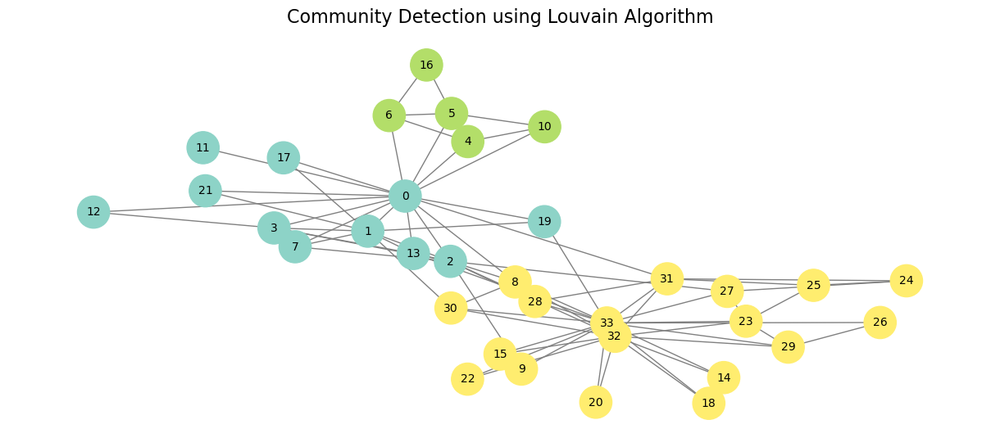

In [ ]:
# Assign colors to nodes based on their communities
colors = [partition[node] for node in G.nodes()]

# Visualize the graph with nodes colored by community
plt.figure(figsize=(12, 5))
pos = nx.spring_layout(G, seed=42)
nx.draw(
    G, pos, node_color=colors, with_labels=True, cmap=plt.cm.Set3,
    node_size=800, font_size=10, font_color="black", edge_color="gray"
)
plt.title("Community Detection using Louvain Algorithm", fontsize=16)
plt.show()

Now, compare this partition to the actual.



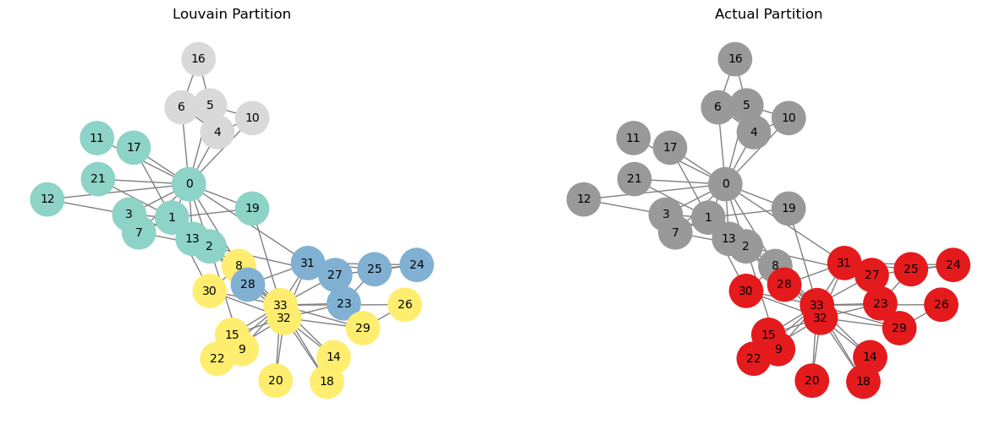

In [ ]:
# Retrieve the "club" attribute for each node (actual partition)
actual_partition = {node: (1 if G.nodes[node]['club'] == 'Mr. Hi' else 0) for node in G.nodes()}

# Assign colors based on Louvain partition and actual partition
louvain_colors = [partition[node] for node in G.nodes()]
actual_colors = [actual_partition[node] for node in G.nodes()]

# Plot both partitions using subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Louvain Partition
axs[0].set_title("Louvain Partition")
nx.draw(
    G, pos, ax=axs[0], node_color=louvain_colors, with_labels=True, cmap=plt.cm.Set3,
    node_size=800, font_size=10, font_color="black", edge_color="gray"
)

# Actual Partition
axs[1].set_title("Actual Partition")
nx.draw(
    G, pos, ax=axs[1], node_color=actual_colors, with_labels=True, cmap=plt.cm.Set1,
    node_size=800, font_size=10, font_color="black", edge_color="gray"
)

plt.show()

In [ ]:
import networkx as nx
from community import community_louvain
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
# Ground truth
ground_truth = [G.nodes[n]['club'] for n in G.nodes()]

# Create a mapping of partition values to community labels
partition_labels = {}
for node, community in partition.items():
    if community not in partition_labels:
        partition_labels[community] = len(partition_labels)
    partition[node] = partition_labels[community]

# Convert ground truth to numerical labels
ground_truth_labels = [0 if club == 'Mr. Hi' else 1 for club in ground_truth]

ari = adjusted_rand_score(ground_truth_labels, list(partition.values()))
nmi = normalized_mutual_info_score(ground_truth_labels, list(partition.values()))

print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")

Adjusted Rand Index: 0.46459109844332386
Normalized Mutual Information: 0.5878497068250674


### 3. Girvan-Newman clustering

Our task in this part will be to implement the Girvan-Newman clustering algorithm. Since NetworkX can do the heavy lifting for us -- computing betweenness centrality -- the code part of the task is relatively straightforward. Most of our effort here is spent interpreting and explaining intermediate results.

Recall from the text the Girvan-Newman clustering algorithm:

1. Create a partition sequence.
    1. Calculate the betweenness centrality for all links.
    2. Remove the link with largest betweenness and create a partition using connected components.
    3. Recalculate the betweenness centrality of the links of the resulting graph.
    4. Repeat from step B until no links remain.
2. Evaluate each partition in the sequence and choose the one with the highest modularity.

During this process, the number of connected components in the graph will increase monotonically as clusters are broken up. Since we are removing one link at a time, the number of connected components can increase by at most one between steps in the sequence -- it's not possible for a single edge to connect more than two nodes, and thus components.

We hope that the resulting partition of the graph will approximate its underlying community structure. We'll use the Karate Club graph here because we know the ground-truth community labels and can compare the result obtained from the algorithm.

In [ ]:
%% capture
!pip install networkx python-louvain matplotlib

#### 3.0 Seeing the graph nodes

Show the graph nodes of $K$.

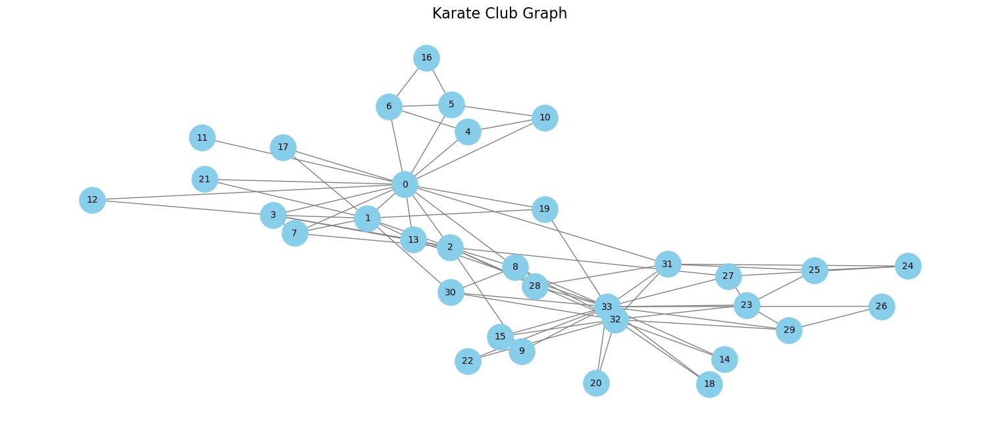

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the Karate Club graph using networkx
G = nx.karate_club_graph()

# Draw the graph
plt.figure(figsize=(15, 6))
pos = nx.spring_layout(G, seed=42)  # Spring layout for aesthetics
nx.draw(
    G, pos, with_labels=True, node_color='skyblue', edge_color='gray',
    node_size=800, font_size=10, font_color='black'
)
plt.title("Karate Club Graph", fontsize=16)
plt.show()

#### 3.1 Create a partition sequence

##### A. Betweenness Centrality

The **betweenness** of an edge $e$ is the fraction of shortest-paths that course through it.

$$c_B(e)=\sum _{i,j \in V}\frac{\sigma (i,j)|e}{\sigma (i,j)},$$

where $\sigma(i,j)$ is the total number of shortest paths and $\sigma (i,j)|e$ is the number of shortest paths that pass through edge $e$. In `networkx`, the function is `edge_betweenness_centrality(G)`. Below, we illustrate the function using Zachary's karate club $K$.

Calculate the betweenness centrality for all links.



In [ ]:
import networkx as nx

K = nx.karate_club_graph()

edge_betweenness = nx.edge_betweenness_centrality(K)

for edge, centrality in edge_betweenness.items():
    print(f"Edge: {edge}, Betweenness Centrality: {centrality:.4f}")


Edge: (0, 1), Betweenness Centrality: 0.0253
Edge: (0, 2), Betweenness Centrality: 0.0778
Edge: (0, 3), Betweenness Centrality: 0.0205
Edge: (0, 4), Betweenness Centrality: 0.0523
Edge: (0, 5), Betweenness Centrality: 0.0781
Edge: (0, 6), Betweenness Centrality: 0.0781
Edge: (0, 7), Betweenness Centrality: 0.0228
Edge: (0, 8), Betweenness Centrality: 0.0742
Edge: (0, 10), Betweenness Centrality: 0.0523
Edge: (0, 11), Betweenness Centrality: 0.0588
Edge: (0, 12), Betweenness Centrality: 0.0465
Edge: (0, 13), Betweenness Centrality: 0.0424
Edge: (0, 17), Betweenness Centrality: 0.0401
Edge: (0, 19), Betweenness Centrality: 0.0459
Edge: (0, 21), Betweenness Centrality: 0.0401
Edge: (0, 31), Betweenness Centrality: 0.1273
Edge: (1, 2), Betweenness Centrality: 0.0232
Edge: (1, 3), Betweenness Centrality: 0.0077
Edge: (1, 7), Betweenness Centrality: 0.0074
Edge: (1, 13), Betweenness Centrality: 0.0124
Edge: (1, 17), Betweenness Centrality: 0.0187
Edge: (1, 19), Betweenness Centrality: 0.0146

The resulting dictionary has edge tuples as the keys, and each associated value is the betweenness centrality of that edge. The algorithm to compute the edge betweenness of all edges in a graph costs about the same as calculating it for a single edge, so we'll make use of this dictionary with the computed values for every edge.

Once computed for all edges, we can easily get the associated betweenness for a single edge. For example, get the edge betweenness of the edge between nodes 0 and 1:



In [ ]:
print(f"Betweenness Centrality for edge (0, 1): {edge_betweenness.get((0, 1), 0):.4f}")

Betweenness Centrality for edge (0, 1): 0.0253


##### B. Remove the link with largest betweenness

Given this dictionary of betweenness values for each edge, we can make use of max function to give us the key in this dictionary with the greatest value.



In [ ]:
max_edge = max(edge_betweenness, key=edge_betweenness.get)
max_betweenness = edge_betweenness[max_edge]

print(f"Edge with highest betweenness centrality: {max(edge_betweenness, key=edge_betweenness.get)}, Value: {edge_betweenness[max_edge]:.4f}")

Edge with highest betweenness centrality: (0, 31), Value: 0.1273


This is then the edge we want to remove at this step in the next process.

#####  C. Recalculate the betweenness centrality of the links of the resulting graph, & D. Repeat from step B until no links remain

This implies that we need a loop to repeat this process $L$ times, once for each edge, and that we should keep track of the partitions generated. Straightforward stuff. We'll start with a fresh Karate Club graph since we removed some edges above:



In [ ]:
import networkx as nx

# Load the Karate Club graph
K = nx.karate_club_graph()

# Initialize a list to store the partitions
partitions_sequence = []

# Loop until all edges are removed
while K.number_of_edges() > 0:
    # Calculate edge betweenness centrality
    edge_betweenness = nx.edge_betweenness_centrality(K)
    
    # Find the edge with the maximum betweenness centrality
    max_edge = max(edge_betweenness, key=edge_betweenness.get)
    
    # Remove the edge with the largest betweenness
    K.remove_edge(*max_edge)

    # Get the connected components (partitions) after edge removal
    partitions = list(nx.connected_components(K))
    
    # Store the current partition
    partitions_sequence.append(partitions)

# Display the partitions generated at each step
for i, partitions in enumerate(partitions_sequence):
    print(f"Step {i + 1}: Partitions: {partitions}")


Step 1: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
Step 2: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
Step 3: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
Step 4: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
Step 5: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
Step 6: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
Step 7: Partitions: [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23

##### E. Evaluate the modularity of each partition in the sequence

We now have a sequence of partitions and a function to calculate the modularity of a partition. This is a great time to use a list comprehension!



In [ ]:
import networkx as nx
from networkx.algorithms.community.quality import modularity

# Load the Karate Club dataset
G = nx.karate_club_graph()

# Function to calculate modularity for each partition
for idx, partitions in enumerate(partitions_sequence):
    # Convert partitions to a format NetworkX expects
    formatted_partitions = [list(community) for community in partitions]
    Q = modularity(G, formatted_partitions)
    print(f"Partition Sequence {idx + 1}: Modularity: {Q}")


Partition Sequence 1: Modularity: 0.0
Partition Sequence 2: Modularity: 0.0
Partition Sequence 3: Modularity: 0.0
Partition Sequence 4: Modularity: 0.0
Partition Sequence 5: Modularity: 0.0
Partition Sequence 6: Modularity: 0.0
Partition Sequence 7: Modularity: 0.0
Partition Sequence 8: Modularity: 0.0
Partition Sequence 9: Modularity: 0.0
Partition Sequence 10: Modularity: 0.0
Partition Sequence 11: Modularity: 0.3476602762317048
Partition Sequence 12: Modularity: 0.3476602762317048
Partition Sequence 13: Modularity: 0.3476602762317048
Partition Sequence 14: Modularity: 0.3423192968647514
Partition Sequence 15: Modularity: 0.3423192968647514
Partition Sequence 16: Modularity: 0.3423192968647514
Partition Sequence 17: Modularity: 0.3423192968647514
Partition Sequence 18: Modularity: 0.3580611307884035
Partition Sequence 19: Modularity: 0.3580611307884035
Partition Sequence 20: Modularity: 0.3580611307884035
Partition Sequence 21: Modularity: 0.3580611307884035
Partition Sequence 22: Mo

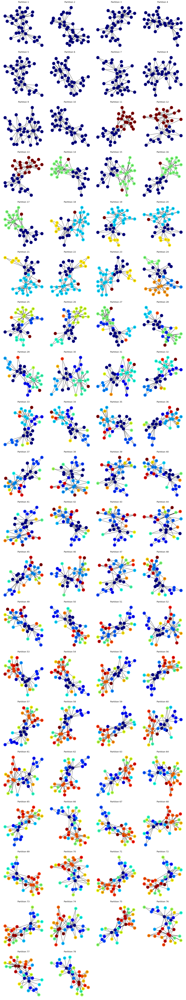

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import math

G = nx.karate_club_graph()

def visualize_partition(graph, partitions_sequence):
    num_partitions = len(partitions_sequence)
    rows = math.ceil(num_partitions / 4)  
    cols = min(4, num_partitions)        

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
    axes = axes.flatten()  

    for idx, partitions in enumerate(partitions_sequence):
        color_map = {}
        for color, community in enumerate(partitions):
            for node in community:
                color_map[node] = color

        node_colors = [color_map[node] for node in graph.nodes]

        
        nx.draw(
            graph,
            ax=axes[idx],
            with_labels=True,
            node_color=node_colors,
            cmap=plt.cm.jet,
            node_size=300,
            font_size=8
        )
        axes[idx].set_title(f"Partition {idx + 1}")

    # Hide any extra subplots
    for extra_ax in axes[len(partitions_sequence):]:
        extra_ax.axis("off")

    plt.tight_layout()
    plt.show()

# Visualize the partitions
visualize_partition(G, partitions_sequence)


Get the partition with highest modularity:



In [ ]:
import matplotlib.pyplot as plt
from networkx.algorithms.community.quality import modularity

# Load the Karate Club dataset
G = nx.karate_club_graph()

# Function to calculate modularities
def calculate_modularities(graph, partitions_sequence):
    modularity_scores = []
    for idx, partitions in enumerate(partitions_sequence):
        formatted_partitions = [list(community) for community in partitions]
        Q = modularity(graph, formatted_partitions)
        modularity_scores.append((idx, Q, partitions))  # Store index, modularity, and partition
    return modularity_scores

# Get modularity scores
modularity_scores = calculate_modularities(G, partitions_sequence)

# Find the partition with the highest modularity
best_partition_idx, best_modularity, best_partition = max(modularity_scores, key=lambda x: x[1])

print(f"Partition with the highest modularity:")
print(f"Index: {best_partition_idx + 1}")
print(f"Modularity: {best_modularity}")
print(f"Partition: {best_partition}")

Partition with the highest modularity:
Index: 24
Modularity: 0.3849721706864564
Partition: [{0, 1, 3, 7, 11, 12, 13, 17, 19, 21}, {2, 24, 25, 27, 28, 31}, {4, 5, 6, 10, 16}, {32, 33, 8, 14, 15, 18, 20, 22, 23, 26, 29, 30}, {9}]


The partition of the karate club graph with highest modularity actually has five components! Visualize them.



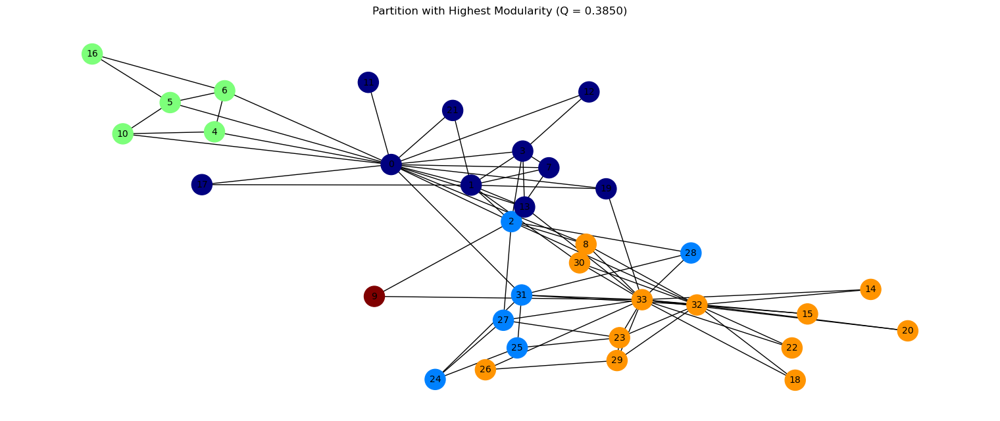

In [ ]:
color_map = {}
for color, community in enumerate(best_partition):
    for node in community:
        color_map[node] = color

node_colors = [color_map[node] for node in G.nodes]

plt.figure(figsize=(15, 6))
nx.draw(
    G,
    with_labels=True,
    node_color=node_colors,
    cmap=plt.cm.jet,
    node_size=500,
    font_size=10
)
plt.title(f"Partition with Highest Modularity (Q = {best_modularity:.4f})")
plt.show()

It's higher than the "ground truth" communities we evaluated in section 3, which is a good sign, but for the specific problem of trying to predict the post-split community membership, a clustering into five groups is useless to us.



##### F. Get the best partition with a given number of communities

One of the most useful parts of the Girvan-Newman algorithm is that it is also useful when we have a specific number of clusters we want. In this case, we know the karate club split into two groups, so let's get the partition in the sequence with two components:



In [ ]:
# Find partitions with exactly two groups
two_group_partitions = [
    (idx, partitions) 
    for idx, partitions in enumerate(partitions_sequence) 
    if len(partitions) == 2
]

print("Partitions with exactly two groups:")
for idx, (partition_idx, partition) in enumerate(two_group_partitions):
    print(f"{idx + 1}. Partition Index: {partition_idx + 1}, Partition: {partition}")


Partitions with exactly two groups:
1. Partition Index: 11, Partition: [{0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21}, {2, 8, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
2. Partition Index: 12, Partition: [{0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21}, {2, 8, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
3. Partition Index: 13, Partition: [{0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21}, {2, 8, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]


Compare to the ground truth community labels:



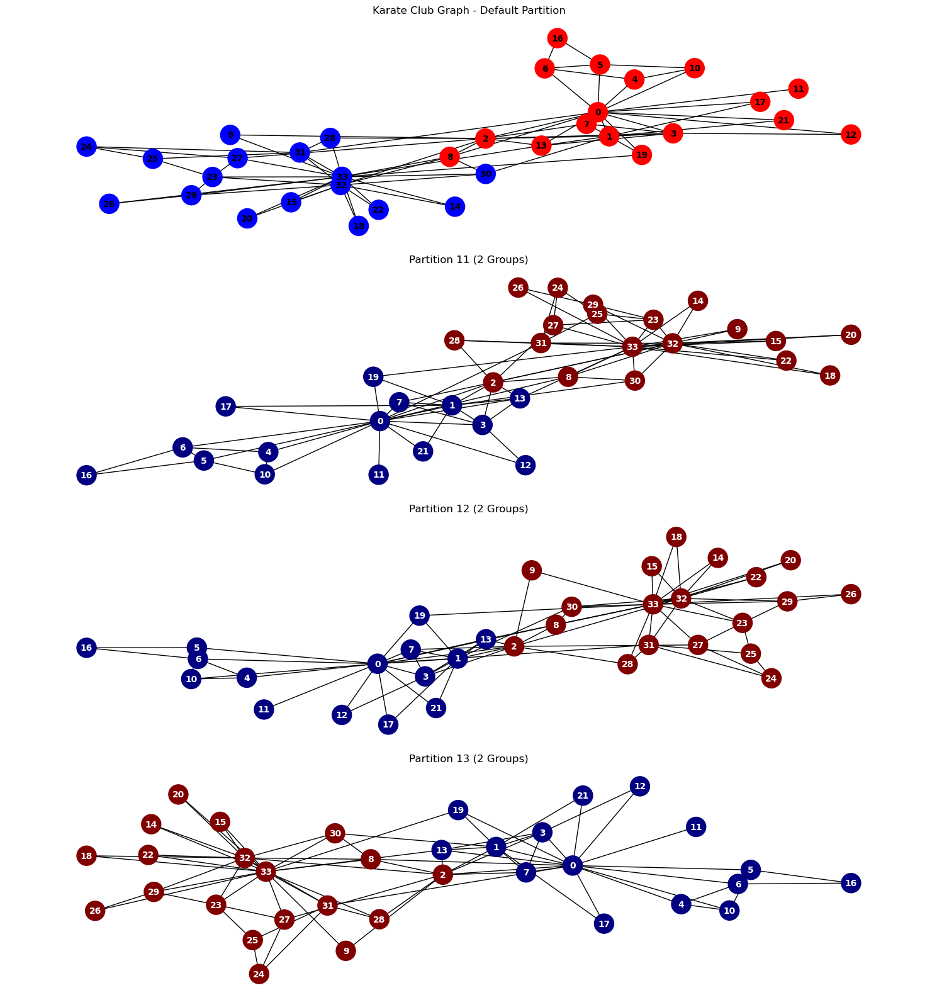

In [ ]:
num_partitions = len(two_group_partitions)
fig, axes = plt.subplots(1 + num_partitions, 1, figsize=(15, 4 * (1 + num_partitions)))  # One row for the original graph and one per partition
axes = axes.flatten()

group_colors = ['red' if G.nodes[n]['club'] == 'Mr. Hi' else 'blue' for n in G.nodes()]

# Plot the default partition
nx.draw(
    G,
    ax=axes[0],
    node_color=group_colors,
    node_size=500,
    with_labels=True,
    font_size=10,
    font_color="black",
    font_weight="bold"
)
axes[0].set_title("Karate Club Graph - Default Partition")

for i, (partition_idx, partition) in enumerate(two_group_partitions):
    color_map = {}
    for color, community in enumerate(partition):
        for node in community:
            color_map[node] = color

    node_colors = [color_map[node] for node in G.nodes]
  
    nx.draw(
        G,
        ax=axes[i + 1],
        with_labels=True,
        node_color=node_colors,
        cmap=plt.cm.jet,
        node_size=500,
        font_size=10,
        font_color="white",  
        font_weight="bold"   
    )
    axes[i + 1].set_title(f"Partition {partition_idx + 1} (2 Groups)")

plt.tight_layout()
plt.show()


### 4. Marvel Universe Network

In [ ]:
 !pip install powerlaw
 !pip install python-louvain

  Obtaining dependency information for powerlaw from https://files.pythonhosted.org/packages/e8/26/e0daa306f83d705bc1ed4d6759b7fc945cc787530c230ee1fe299cc28093/powerlaw-1.5-py3-none-any.whl.metadata


In [ ]:
import csv
import networkx as nx
import numpy as np
import pandas as pd
import community
import powerlaw
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import operator
import collections
import sys
from tqdm import tqdm
import random

You can download this dataset from this  [link](https://github.com/arangodb/example-datasets/blob/master/Graphs/Marvel%20Universe/hero-comic-network.csv).

#### Read the Dataset

In [ ]:
Hero_Comic_Network = pd.read_csv("hero-comic-network.csv", header=None, names=['col1', 'col2'])
Hero_Comic_Network.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96655 entries, 0 to 96654
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   col1    96655 non-null  object
 1   col2    96655 non-null  object
dtypes: object(2)
memory usage: 1.5+ MB


#### Find and plot the community in the Marvel Dataset

##### Create graph


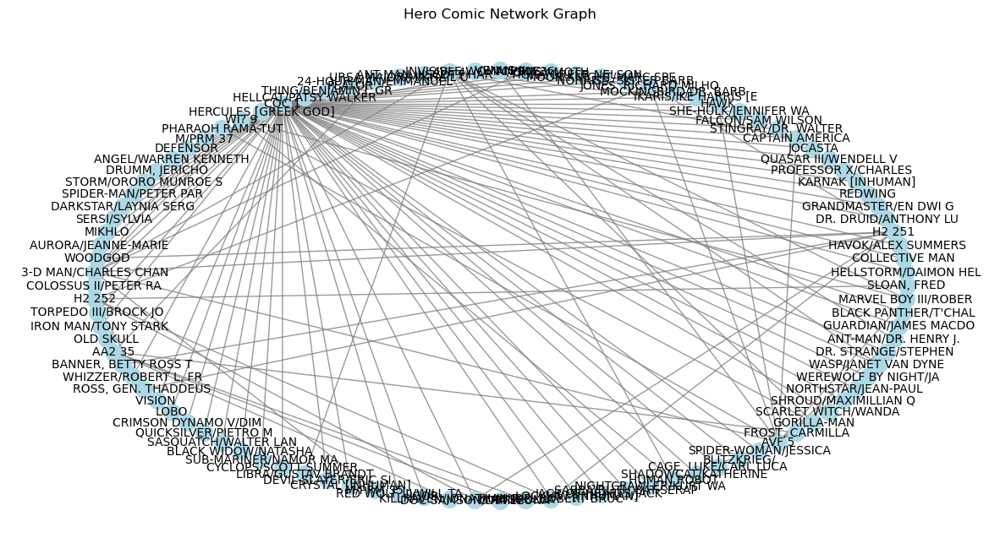

In [ ]:
sampled = Hero_Comic_Network.sample(frac=0.001, random_state=20) #1000 elements
# Create a graph from the edge list
g = nx.from_pandas_edgelist(Hero_Comic_Network, 'col1', 'col2')
G = g.subgraph(list(g.nodes())[:100])

plt.figure(figsize=(15, 8))
pos = nx.circular_layout(G)  # positions for all nodes
nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=200)
nx.draw_networkx_edges(G, pos, alpha=0.8, edge_color='grey')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

# Title and display
plt.title("Hero Comic Network Graph")
plt.axis('off')  # Turn off the axis
plt.show()


##### Find the partition with community Louvain function



In [ ]:
import community as community_louvain
partition = community_louvain.best_partition(G)

##### Visualize the Network Using NetworkX and save the figure



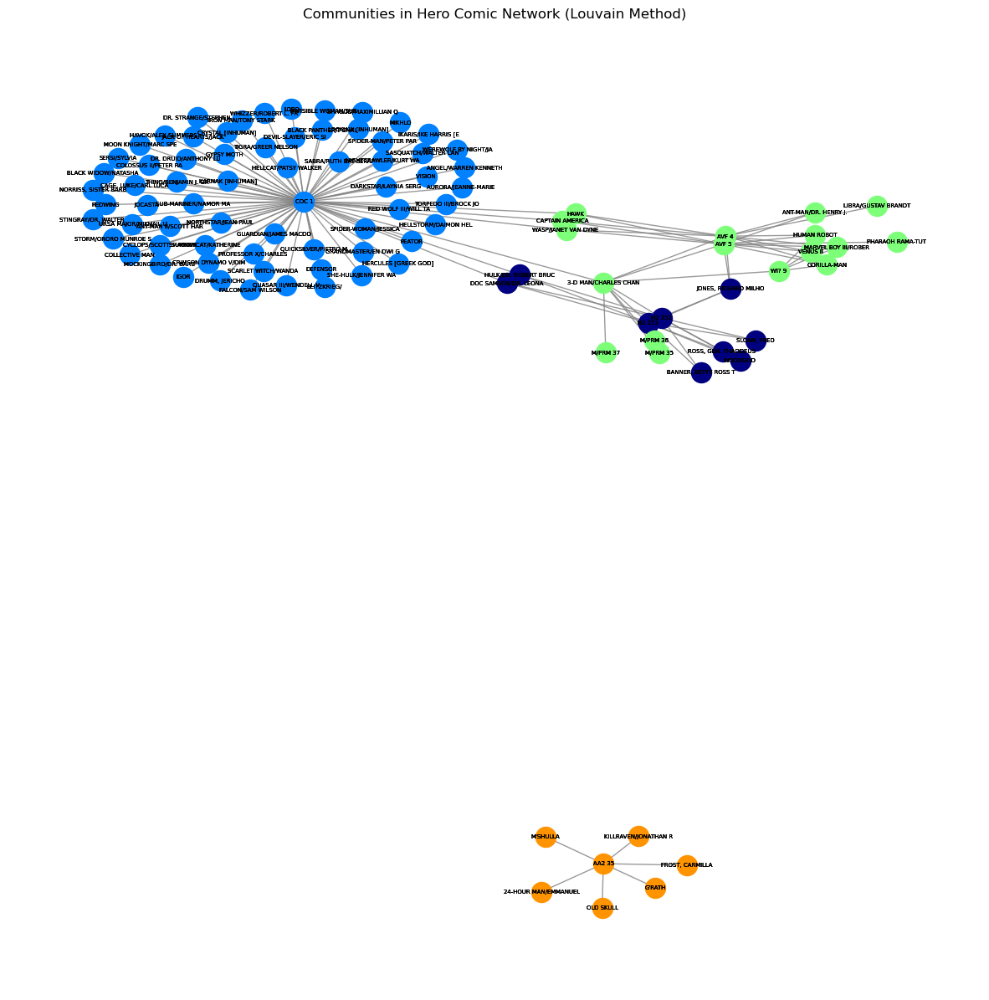

<Figure size 640x480 with 0 Axes>

In [ ]:
# Draw the graph with communities
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42)

# Get unique community IDs
unique_communities = set(partition.values())

# Draw nodes with colors based on their community
for community_id in unique_communities:
    nodes = [node for node in partition.keys() if partition[node] == community_id]
    nx.draw_networkx_labels(G, pos, font_size=5, font_color='black')
    nx.draw_networkx_nodes(G, pos, nodelist=nodes, node_color=plt.cm.jet(community_id / len(unique_communities)), label=f'Community {community_id}', node_size=300)

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.8, edge_color='grey')
plt.title("Communities in Hero Comic Network (Louvain Method)")
plt.axis('off')
plt.show()

# Save the figure
output_path = 'hero_comic_network.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight') 

# **Spectral Clustering**

### **Fundamental Question**: Why do we use Graphs for clustering ?

> Enter your answer here ():

> - **Natural representation of relationships**: Graphs provide a natural representation of relationships between data points, allowing for the modeling of complex structures and patterns in the data.
> - **Capturing geometry and topology**: Graphs can capture the geometry and topology of high-dimensional data, enabling the identification of clusters with complex shapes and structures.
> - **Handling noisy and missing data**: Graphs can tolerate noisy and missing data by focusing on the connections between data points rather than individual features.
> - **Scalability**: Graph-based clustering algorithms can scale to large datasets and handle massive amounts of data, making them suitable for big data applications.
> - **Flexibility**: Graphs can accommodate various types of data, including categorical, numerical, and mixed-type data, and allow for the use of different similarity measures and clustering algorithms.
> - **Community detection**: Graphs enable the detection of communities or clusters with high internal density and low inter-cluster connectivity, which is essential in many applications, such as social network analysis and bioinformatics.
> - **Modularity-based clustering**: Graphs can be used to optimize modularity, a measure of how well a clustering solution separates clusters from each other, leading to more meaningful and interpretable clusters.
> - **Integration with other techniques**: Graph-based clustering can be combined with other techniques, such as dimensionality reduction and feature selection, to improve clustering performance and interpretability.

###  Graph Clustering Formulation and Notation
---
* Consider $n$ data points, $\mathcal{D}=\{ x_i\}_{i=1}^n$, and a **similarity measure** $w(x_i, x_j) = w_{ij} \geq 0$
* **Goal**: divide the data into $k$ groups or clusters such that points in the same group are similar and points in different groups are dissimilar to each other.
* Let $G=(V,E)$ be an *undirected* graph with vertex set $V=\{v_1, ..., v_n\}$
    * The vertex $v_i$ in the graph represents the data point $x_i$

#### Similarity Graph
---
The goal is to build a graph based on what we described. There are 3 types of similarity graph that we can build:

* *$\epsilon$-neighborhood graph* - we connect all points whose pairwise distances are smaller than $\epsilon$. As the distances between all connected points are roughly of the same scale, weighting the edges would not incorporate more information about the data to the graph. Hence, the $\epsilon$-neighborhood graph is usually considered as an **unweighted** /graph.

* KNN graph - Here we use $K$-Nearest Neighbors to connect vertex $v_i$ with vertex $v_j$ if $v_j$ is among the $K$-nearest neighbors of $v_i$.
    * A problem with that is that if the nearest neighbors are not symmetric, i.e. if there is a vertex $v_i$ which has $v_j$ as a nearest neighbor, it is not necessary that $v_i$ is a nearest neighbor of $v_j$. Thus, we end up getting a directed graph which is a problem as we do not know what similarity between 2 points means in that case. There are two ways of making this graph undirected:
        * Ignore the directions of the edges, i.e. we connect $v_i$ and $v_j$ with an undirected edge if $v_i$ is among the $K$-nearest neighbors of $v_j$ or if $v_j$ is among the $K$-nearest neighbors of $v_i$ . The resulting graph is what is usually called the $K$-nearest neighbor graph.
        * Connect vertices $v_i$ and $v_j$ if both $v_i$ is among the $K$-nearest neighbors of $v_j$ and $v_j$ is among the $K$-nearest neighbors of $v_i$ . The resulting graph is called the *mutual* $K$-nearest neighbor graph.

* Fully connected graph - we connect all points with each other, and we weight all edges by similarity $s_{ij}$. This graph should model the local neighborhood relationships, thus similarity functions such as Gaussian similarity function are used.

#### Graph Laplacians
---
We define 2 types of graph Laplacians:
1. The **unnormalized** graph Laplacian matrix: $$ L=D-W $$
2. The **normalized** graph Laplacian matrix:
    * **Symmetric** version: $$ L_{sym} = D^{-\frac{1}{2}}LD^{-\frac{1}{2}} $$
    * **Random Walk** version: $$ L_{rw} = D^{-1}L = I - D^{-1}W $$

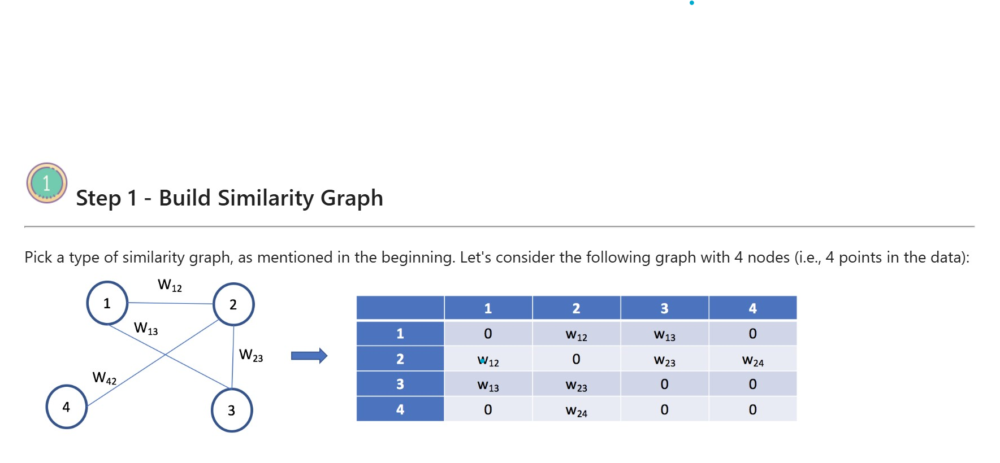

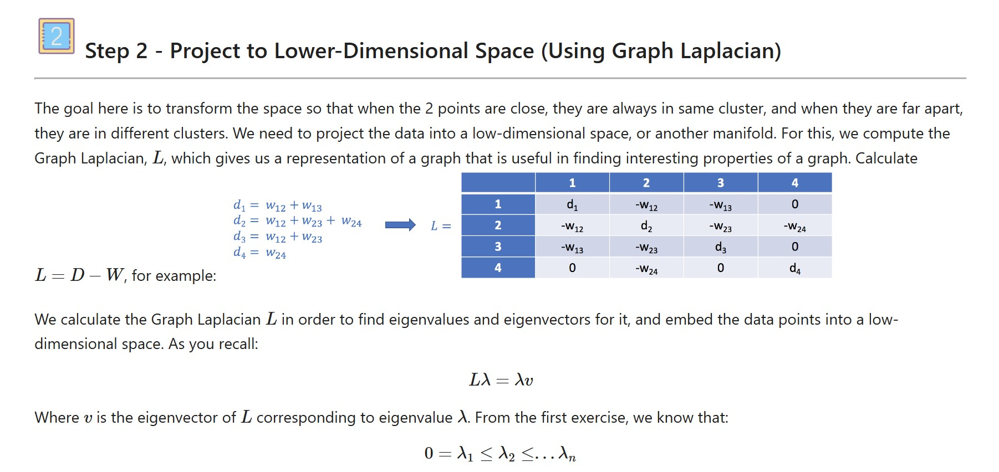

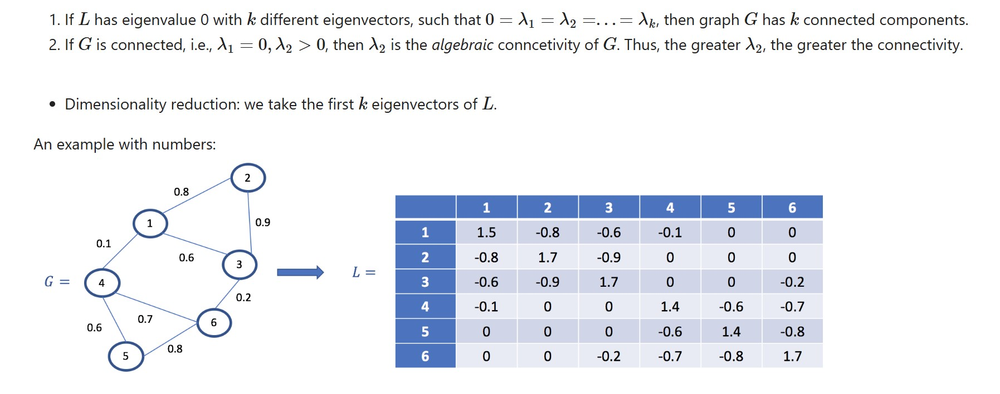

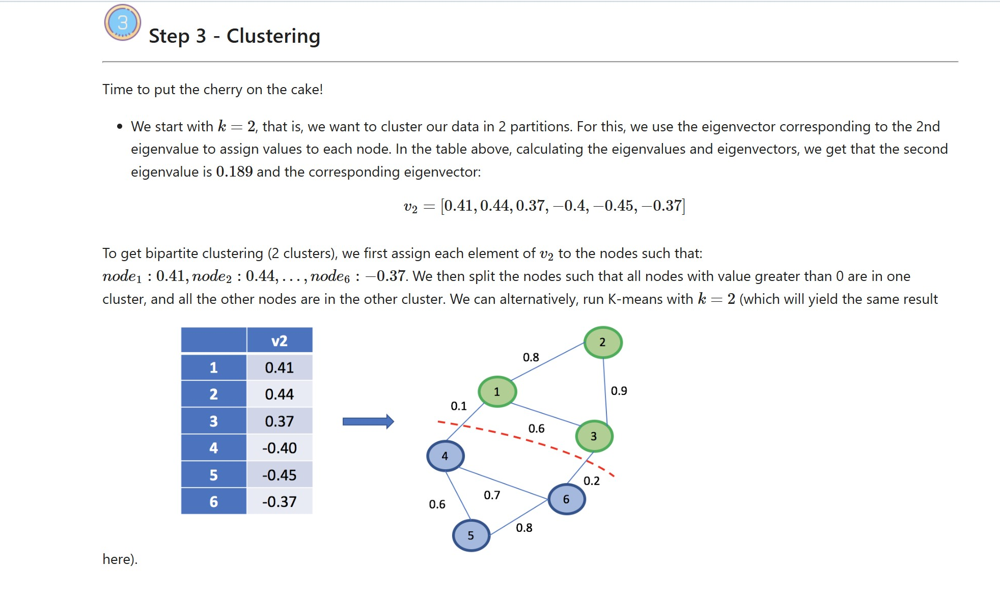

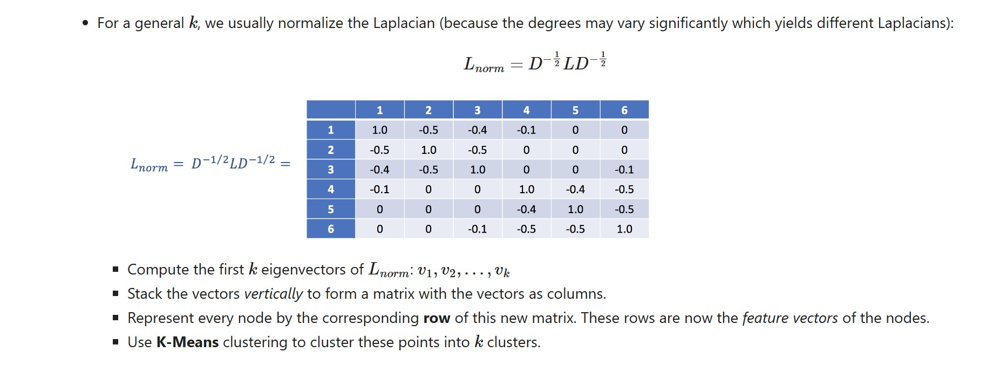

### Implement Spectral Clustering and Compare It to K-Means

#### Apply Spectral Clustering and compare its performance with K-Means on the provided dataset.

*Hint* : you can use the Moons dataset from `scikit-learn`.



c:\Users\HAMAHANG\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\HAMAHANG\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\HAMAHANG\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


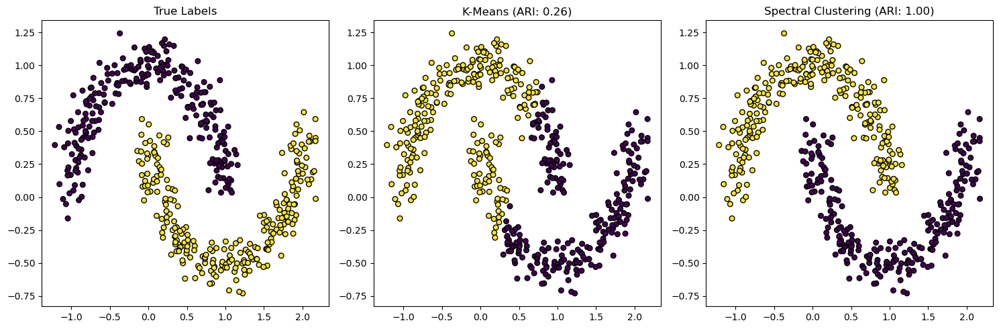

Adjusted Rand Index (K-Means): 0.26
Adjusted Rand Index (Spectral Clustering): 1.00


In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import adjusted_rand_score

# Generate the Moons Dataset
X, y_true = make_moons(n_samples=500, noise=0.1, random_state=42)

# Apply K-Means Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
y_kmeans = kmeans.fit_predict(X)

# Apply Spectral Clustering
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', random_state=42)
y_spectral = spectral.fit_predict(X)

# Evaluate Performance
ari_kmeans = adjusted_rand_score(y_true, y_kmeans)
ari_spectral = adjusted_rand_score(y_true, y_spectral)

# Visualization
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# True Labels
axes[0].scatter(X[:, 0], X[:, 1], c=y_true, cmap='viridis', s=30, edgecolor='k')
axes[0].set_title("True Labels")

# K-Means 
axes[1].scatter(X[:, 0], X[:, 1], c=y_kmeans, cmap='viridis', s=30, edgecolor='k')
axes[1].set_title(f"K-Means (ARI: {ari_kmeans:.2f})")

# Spectral 
axes[2].scatter(X[:, 0], X[:, 1], c=y_spectral, cmap='viridis', s=30, edgecolor='k')
axes[2].set_title(f"Spectral Clustering (ARI: {ari_spectral:.2f})")

plt.tight_layout()
plt.show()

print(f"Adjusted Rand Index (K-Means): {ari_kmeans:.2f}")
print(f"Adjusted Rand Index (Spectral Clustering): {ari_spectral:.2f}")


#### Do this for Karate club



c:\Users\HAMAHANG\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\HAMAHANG\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\HAMAHANG\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


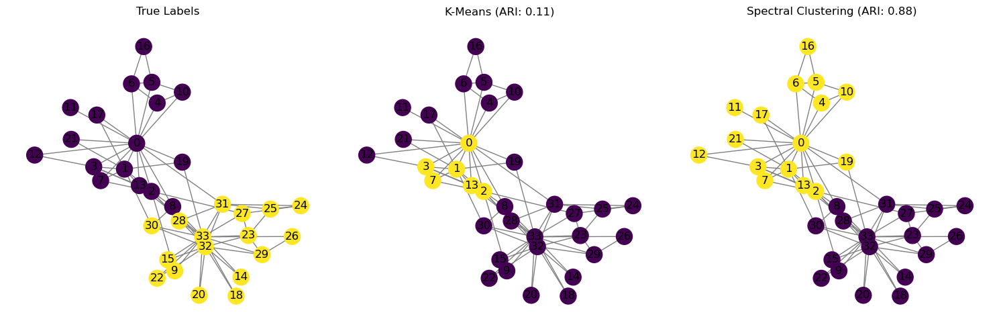

Adjusted Rand Index (K-Means): 0.11
Adjusted Rand Index (Spectral Clustering): 0.88


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import adjusted_rand_score

graph = nx.karate_club_graph()
true_labels = [graph.nodes[node]['club'] for node in graph.nodes]
true_labels = np.array([0 if label == 'Mr. Hi' else 1 for label in true_labels])

# Adjacency Matrix
adj_matrix = nx.adjacency_matrix(graph).toarray()

# Apply Spectral Clustering
spectral = SpectralClustering(n_clusters=2, affinity='precomputed', random_state=42)
y_spectral = spectral.fit_predict(adj_matrix)

# Apply K-Means Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
y_kmeans = kmeans.fit_predict(adj_matrix)

# Evaluate Performance
ari_kmeans = adjusted_rand_score(true_labels, y_kmeans)
ari_spectral = adjusted_rand_score(true_labels, y_spectral)

# Visualization
pos = nx.spring_layout(graph, seed=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# True Labels
nx.draw(graph, pos, node_color=true_labels, with_labels=True, ax=axes[0], cmap='viridis', node_size=300, edge_color='gray')
axes[0].set_title("True Labels")

# K-Means Clustering
nx.draw(graph, pos, node_color=y_kmeans, with_labels=True, ax=axes[1], cmap='viridis', node_size=300, edge_color='gray')
axes[1].set_title(f"K-Means (ARI: {ari_kmeans:.2f})")

# Spectral Clustering
nx.draw(graph, pos, node_color=y_spectral, with_labels=True, ax=axes[2], cmap='viridis', node_size=300, edge_color='gray')
axes[2].set_title(f"Spectral Clustering (ARI: {ari_spectral:.2f})")

plt.tight_layout()
plt.show()

print(f"Adjusted Rand Index (K-Means): {ari_kmeans:.2f}")
print(f"Adjusted Rand Index (Spectral Clustering): {ari_spectral:.2f}")


#### **Question**: What do you see in the output? Why?

> Enter your answer here ():

1. Moons Dataset:
    - K-Means:
    struggles because it assumes spherical clusters, which is not suitable for the non-linear structure of the moons dataset.
    - Spectral Clustering:
    performs perfectly, as it captures the non-linear relationships by transforming the data into a graph structure and clustering based on graph connectivity.
2. Karate Club Dataset:
    - K-Means:
        fails to separate the two communities effectively because it does not leverage the graph structure and instead uses a flat adjacency matrix representation.
    - Spectral Clustering:
        captures the underlying graph structure by using the adjacency matrix as an affinity matrix. This allows it to identify the two communities much more effectively.
--- 
- **Conclusion**

    - K-Means:
        Works well for linearly separable and spherical clusters but struggles with non-linear or graph-structured 
        data.
        Limited performance on datasets with complex geometries (e.g., moons) or connections (e.g., graphs).

    - Spectral Clustering:
        Excels in both non-linear separability (moons) and graph-based clustering (karate club).
        Utilizes graph theory to handle complex relationships effectively.
        Requires computational resources for eigenvalue decomposition, making it less scalable for very large 
        datasets.